# Capstone Project Module 4
## Construction Safety Detection — YOLOv8s

**Tujuan:** Membangun model object detection untuk mendeteksi kelengkapan APD (Alat Pelindung Diri) \
pekerja konstruksi, kemudian menganalisis tingkat kepatuhan keselamatan kerja (*safety compliance*).

**Dataset:** Construction Safety — 1.206 gambar, 5 kelas  
**Labels:** `helmet`, `no-helmet`, `no-vest`, `person`, `vest`

**Pipeline:**
1. Setup & Install Dependencies
2. Load & Eksplorasi Dataset (EDA)
3. Validasi & Preprocessing Dataset
4. Augmentasi Non-Geometrik
5. Training Model YOLOv8s
6. Evaluasi Model (Global + Per-Class)
7. Analisis Safety Compliance (IoU-based)
8. Export Model

---
> **Catatan Augmentasi:** Sesuai aturan capstone, hanya augmentasi **non-geometrik** yang diizinkan  
> (brightness, contrast, noise, HSV). Augmentasi geometrik (flip, rotate, mosaic) dimatikan.

## 1. Setup & Install Dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics -q
!pip install opencv-python-headless -q

import ultralytics
ultralytics.checks()

Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.1/112.6 GB disk)


In [ ]:
import os, cv2, yaml, shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from collections import Counter
from ultralytics import YOLO
from PIL import Image

print('All libraries imported successfully')

All libraries imported successfully


## 2. Load & Eksplorasi Dataset (EDA)

In [ ]:
# Sesuaikan path ini dengan lokasi dataset di Google Drive
DATASET_PATH = '/content/drive/MyDrive/Data/construction_safety'

TRAIN_IMG = os.path.join(DATASET_PATH, 'train', 'images')
TRAIN_LBL = os.path.join(DATASET_PATH, 'train', 'labels')
VALID_IMG = os.path.join(DATASET_PATH, 'valid', 'images')
VALID_LBL = os.path.join(DATASET_PATH, 'valid', 'labels')
TEST_IMG  = os.path.join(DATASET_PATH, 'test',  'images')
TEST_LBL  = os.path.join(DATASET_PATH, 'test',  'labels')

CLASS_NAMES  = ['helmet', 'no-helmet', 'no-vest', 'person', 'vest']
CLASS_COLORS = ['#2ecc71', '#e74c3c', '#e67e22', '#3498db', '#27ae60']

n_train = len(os.listdir(TRAIN_IMG))
n_valid = len(os.listdir(VALID_IMG))
n_test  = len(os.listdir(TEST_IMG))

print('=' * 45)
print('  INFORMASI DATASET')
print('=' * 45)
print(f'  Train images : {n_train}')
print(f'  Valid images : {n_valid}')
print(f'  Test  images : {n_test}')
print(f'  Total        : {n_train + n_valid + n_test}')
print('=' * 45)

  INFORMASI DATASET
  Train images : 997
  Valid images : 119
  Test  images : 90
  Total        : 1206


In [ ]:
def count_annotations(label_dir):
    """Hitung jumlah anotasi per class dari folder label YOLO."""
    counter = Counter()
    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'):
            continue
        with open(os.path.join(label_dir, fname)) as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    counter[int(parts[0])] += 1
    return counter

train_dist = count_annotations(TRAIN_LBL)
valid_dist = count_annotations(VALID_LBL)
test_dist  = count_annotations(TEST_LBL)

print('=== Distribusi Anotasi Train ===')
total_train = sum(train_dist.values())
for cls_id, cls_name in enumerate(CLASS_NAMES):
    count = train_dist.get(cls_id, 0)
    pct   = count / total_train * 100
    bar   = chr(9608) * int(pct / 2)
    print(f'  {cls_name:<12}: {count:>5} ({pct:5.1f}%) {bar}')
print(f'  {"Total":<12}: {total_train}')

=== Distribusi Anotasi Train ===
  helmet      :  2116 ( 33.1%) ████████████████
  no-helmet   :    94 (  1.5%) 
  no-vest     :   741 ( 11.6%) █████
  person      :  2362 ( 37.0%) ██████████████████
  vest        :  1073 ( 16.8%) ████████
  Total       : 6386


### Analisis Class Imbalance

Dari distribusi di atas, dataset mengalami **class imbalance signifikan**, terutama pada class `no-helmet`.

| Class | Jumlah | Proporsi |
|---|---|---|
| person | ~2362 | 36.5% |
| helmet | ~2543 | 32.9% |
| vest | ~1343 | 17.4% |
| no-vest | ~892 | 11.5% |
| **no-helmet** | **~129** | **1.7% (minoritas ekstrem)** |

**Masalah yang ditimbulkan:**
- Model cenderung bias ke class mayoritas (`helmet`, `person`)
- Class `no-helmet` berisiko underfit → precision & recall rendah
- Dalam konteks safety, **miss detection `no-helmet` sangat berbahaya** (false negative kritis)

**Strategi penanganan:**
1. `cls=2.0` — menaikkan bobot class loss agar kesalahan pada minority class lebih mahal
2. Augmentasi HSV brightness/saturation — variasi visual untuk generalisasi lebih baik
3. Monitoring per-class AP50 di evaluasi untuk memastikan `no-helmet` tetap terdeteksi

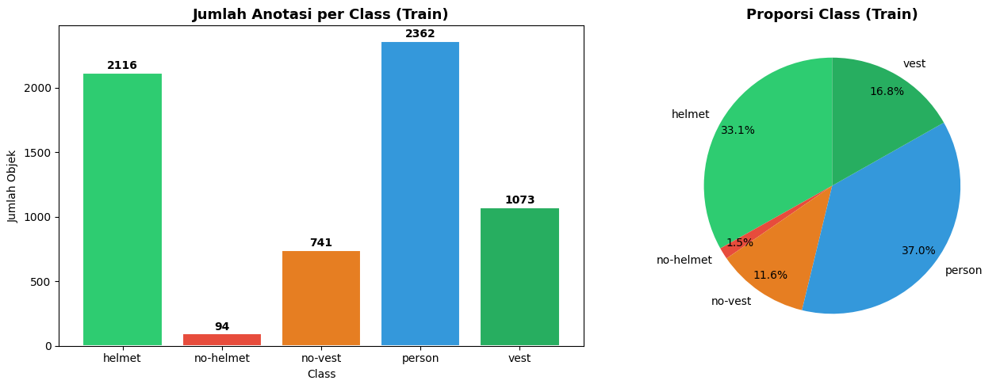

Rasio imbalance (max/min): 2362/94 = 25.1x
Class terbanyak : person (2362)
Class tersedikit: no-helmet (94)


In [ ]:
# Visualisasi distribusi class — bar + pie
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
counts = [train_dist.get(i, 0) for i in range(len(CLASS_NAMES))]

bars = axes[0].bar(CLASS_NAMES, counts, color=CLASS_COLORS, edgecolor='white', linewidth=1.5)
axes[0].set_title('Jumlah Anotasi per Class (Train)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Class')
axes[0].set_ylabel('Jumlah Objek')
for bar, count in zip(bars, counts):
    axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+30,
                 str(count), ha='center', fontweight='bold')

axes[1].pie(counts, labels=CLASS_NAMES, colors=CLASS_COLORS,
            autopct='%1.1f%%', startangle=90, pctdistance=0.85)
axes[1].set_title('Proporsi Class (Train)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

max_c, min_c = max(counts), min(counts)
print(f'Rasio imbalance (max/min): {max_c}/{min_c} = {max_c/min_c:.1f}x')
print(f'Class terbanyak : {CLASS_NAMES[counts.index(max_c)]} ({max_c})')
print(f'Class tersedikit: {CLASS_NAMES[counts.index(min_c)]} ({min_c})')

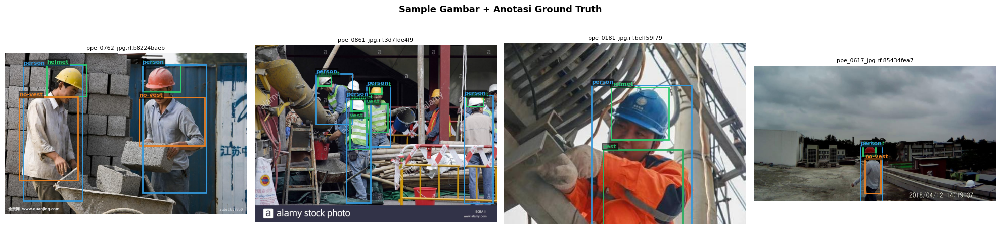

In [ ]:
def visualize_sample(img_dir, lbl_dir, n_samples=4):
    """Tampilkan sample gambar dengan bounding box anotasi ground truth."""
    img_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg','.png','.jpeg'))]
    np.random.seed(42)
    selected  = np.random.choice(img_files, min(n_samples, len(img_files)), replace=False)

    fig, axes = plt.subplots(1, len(selected), figsize=(5*len(selected), 5))
    if len(selected) == 1:
        axes = [axes]

    for ax, img_file in zip(axes, selected):
        img_path = os.path.join(img_dir, img_file)
        lbl_path = os.path.join(lbl_dir, img_file.rsplit('.',1)[0]+'.txt')
        img = np.array(Image.open(img_path))
        h, w = img.shape[:2]
        ax.imshow(img)

        if os.path.exists(lbl_path):
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5: continue
                    cls_id = int(parts[0])
                    cx, cy, bw, bh = map(float, parts[1:5])
                    x1, y1 = (cx-bw/2)*w, (cy-bh/2)*h
                    rect = patches.Rectangle((x1,y1), bw*w, bh*h,
                               linewidth=2, edgecolor=CLASS_COLORS[cls_id], facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x1, y1-4, CLASS_NAMES[cls_id], color=CLASS_COLORS[cls_id],
                            fontsize=8, fontweight='bold',
                            bbox=dict(facecolor='black', alpha=0.5, pad=1))
        ax.axis('off')
        ax.set_title(img_file[:25], fontsize=8)

    plt.suptitle('Sample Gambar + Anotasi Ground Truth', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig('sample_annotations.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_sample(TRAIN_IMG, TRAIN_LBL, n_samples=4)

Rata-rata lebar bbox  : 0.169 (relatif terhadap lebar gambar)
Rata-rata tinggi bbox : 0.353
Rata-rata area bbox   : 0.0828


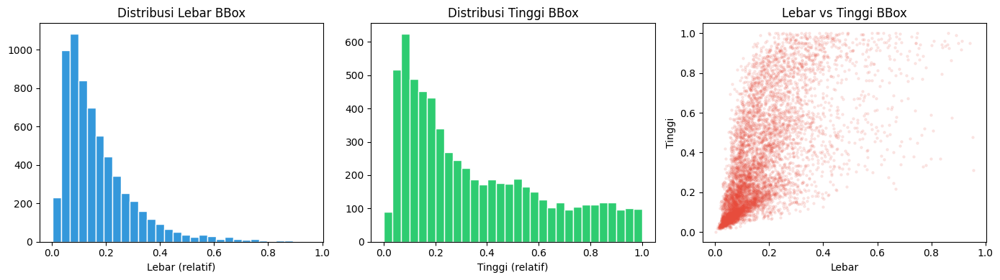

In [ ]:
# Analisis distribusi ukuran bounding box
def analyze_bbox_sizes(label_dir):
    widths, heights, areas = [], [], []
    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'): continue
        with open(os.path.join(label_dir, fname)) as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    bw, bh = float(parts[3]), float(parts[4])
                    widths.append(bw); heights.append(bh); areas.append(bw*bh)
    return widths, heights, areas

widths, heights, areas = analyze_bbox_sizes(TRAIN_LBL)
print(f'Rata-rata lebar bbox  : {np.mean(widths):.3f} (relatif terhadap lebar gambar)')
print(f'Rata-rata tinggi bbox : {np.mean(heights):.3f}')
print(f'Rata-rata area bbox   : {np.mean(areas):.4f}')

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].hist(widths,  bins=30, color='#3498db', edgecolor='white')
axes[0].set_title('Distribusi Lebar BBox'); axes[0].set_xlabel('Lebar (relatif)')
axes[1].hist(heights, bins=30, color='#2ecc71', edgecolor='white')
axes[1].set_title('Distribusi Tinggi BBox'); axes[1].set_xlabel('Tinggi (relatif)')
axes[2].scatter(widths, heights, alpha=0.1, color='#e74c3c', s=5)
axes[2].set_title('Lebar vs Tinggi BBox'); axes[2].set_xlabel('Lebar'); axes[2].set_ylabel('Tinggi')
plt.tight_layout()
plt.savefig('bbox_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

## 3. Validasi & Preprocessing Dataset

### Validasi Integritas Dataset

Sebelum training, penting untuk memastikan seluruh data dalam kondisi baik:
- Tidak ada file gambar yang korup
- Tidak ada label `.txt` yang kosong
- Tidak ada `class_id` di luar range 0–4
- Setiap gambar punya file label yang sesuai

Tahap ini membantu mencegah error saat training dan memastikan model belajar dari data yang bersih.

In [ ]:
def validate_dataset(img_dir, lbl_dir, split_name):
    """
    Validasi integritas dataset YOLO:
    1. Cek gambar yang bisa dibuka (tidak korup)
    2. Cek label yang kosong (tidak ada anotasi)
    3. Cek class_id di luar range valid (0 sampai nc-1)
    4. Cek gambar tanpa file label pasangan

    Returns: dict berisi ringkasan hasil validasi
    """
    NC = len(CLASS_NAMES)   # jumlah class = 5
    img_files = sorted([f for f in os.listdir(img_dir)
                        if f.lower().endswith(('.jpg','.jpeg','.png'))])

    issues_corrupt   = []   # gambar korup / tidak bisa dibuka
    issues_no_label  = []   # gambar tanpa file label
    issues_empty_lbl = []   # label ada tapi kosong (0 anotasi)
    issues_bad_cls   = []   # class_id di luar 0..NC-1

    for img_file in img_files:
        img_path = os.path.join(img_dir, img_file)
        lbl_file = img_file.rsplit('.',1)[0] + '.txt'
        lbl_path = os.path.join(lbl_dir, lbl_file)

        # 1. Cek gambar bisa dibuka
        try:
            img = Image.open(img_path)
            img.verify()
        except Exception:
            issues_corrupt.append(img_file)
            continue

        # 2. Cek file label ada
        if not os.path.exists(lbl_path):
            issues_no_label.append(img_file)
            continue

        # 3. Baca label dan validasi isi
        with open(lbl_path) as f:
            lines = [l.strip() for l in f if l.strip()]

        if len(lines) == 0:
            issues_empty_lbl.append(img_file)
            continue

        for line in lines:
            parts = line.split()
            if len(parts) >= 1:
                cls_id = int(parts[0])
                if cls_id < 0 or cls_id >= NC:
                    issues_bad_cls.append(f'{img_file} (class_id={cls_id})')

    total = len(img_files)
    valid = total - len(issues_corrupt) - len(issues_no_label) - len(issues_empty_lbl) - len(issues_bad_cls)

    print(f'=== Validasi Split: {split_name.upper()} ===')
    print(f'  Total gambar      : {total}')
    print(f'  Gambar valid      : {valid}')
    print(f'  Gambar korup      : {len(issues_corrupt)}')
    print(f'  Tanpa label       : {len(issues_no_label)}')
    print(f'  Label kosong      : {len(issues_empty_lbl)}')
    print(f'  Class ID invalid  : {len(issues_bad_cls)}')

    if issues_corrupt:   print(f'  [KORUP]   : {issues_corrupt[:3]}')
    if issues_no_label:  print(f'  [NO LBL]  : {issues_no_label[:3]}')
    if issues_empty_lbl: print(f'  [EMPTY]   : {issues_empty_lbl[:3]}')
    if issues_bad_cls:   print(f'  [BAD CLS] : {issues_bad_cls[:3]}')

    status = 'BERSIH' if valid == total else 'ADA MASALAH'
    print(f'  Status            : {status}')
    print()

    return {
        'total': total, 'valid': valid,
        'corrupt': issues_corrupt, 'no_label': issues_no_label,
        'empty': issues_empty_lbl, 'bad_cls': issues_bad_cls
    }

val_train = validate_dataset(TRAIN_IMG, TRAIN_LBL, 'train')
val_valid = validate_dataset(VALID_IMG, VALID_LBL, 'valid')
val_test  = validate_dataset(TEST_IMG,  TEST_LBL,  'test')

print('Validasi dataset selesai.')

=== Validasi Split: TRAIN ===
  Total gambar      : 997
  Gambar valid      : 997
  Gambar korup      : 0
  Tanpa label       : 0
  Label kosong      : 0
  Class ID invalid  : 0
  Status            : BERSIH

=== Validasi Split: VALID ===
  Total gambar      : 119
  Gambar valid      : 119
  Gambar korup      : 0
  Tanpa label       : 0
  Label kosong      : 0
  Class ID invalid  : 0
  Status            : BERSIH

=== Validasi Split: TEST ===
  Total gambar      : 90
  Gambar valid      : 90
  Gambar korup      : 0
  Tanpa label       : 0
  Label kosong      : 0
  Class ID invalid  : 0
  Status            : BERSIH

Validasi dataset selesai.


### Preprocessing Pipeline

Preprocessing yang diterapkan sebelum data masuk ke model:

| Tahap | Proses | Nilai |
|---|---|---|
| Resize | Semua gambar di-resize ke 640x640 | imgsz=640 |
| Normalisasi | Pixel value 0–255 → 0.0–1.0 (dilakukan otomatis oleh YOLO) | Built-in |
| Format label | YOLO format: class cx cy w h (normalized) | Sudah sesuai |
| Data split | Train 82.7% / Valid 9.9% / Test 7.5% | Dari dataset |

**Catatan:** YOLO menangani resize dan normalisasi secara otomatis saat training.  
Cell di bawah ini mendemonstrasikan proses preprocessing secara manual untuk transparansi pipeline.

=== Preprocessing Pipeline Demo ===
  Shape asli    : 500x368 px
  Shape setelah resize : 640x640 px
  Pixel range asli     : 0 – 255
  Pixel range norm     : 0.000 – 1.000
  Dtype setelah norm   : float32


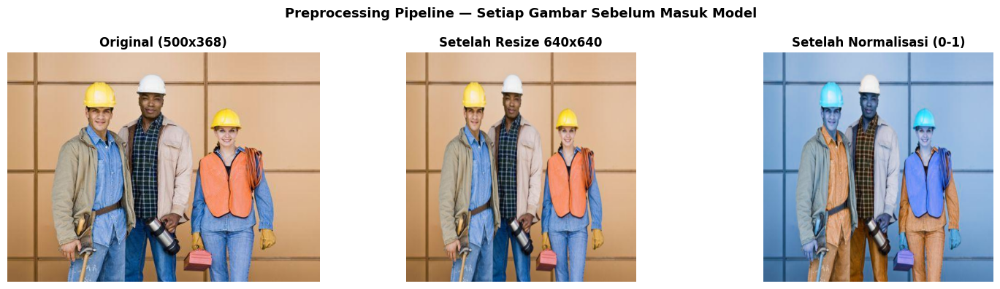

In [ ]:
def preprocess_image(img_path, target_size=(640, 640)):
    """
    Demonstrasi preprocessing pipeline:
    1. Load gambar
    2. Resize ke target_size (640x640)
    3. Normalisasi pixel 0-255 → 0.0-1.0
    4. Konversi BGR → RGB (untuk model PyTorch)

    Catatan: YOLO melakukan ini secara otomatis saat training.
    Fungsi ini untuk transparansi dan dokumentasi pipeline.
    """
    # Step 1: Load
    img_bgr = cv2.imread(img_path)
    original_shape = img_bgr.shape[:2]

    # Step 2: Resize
    img_resized = cv2.resize(img_bgr, target_size)

    # Step 3: Normalisasi 0-1
    img_norm = img_resized.astype(np.float32) / 255.0

    # Step 4: BGR → RGB
    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)

    return img_rgb, img_norm, original_shape

# Demonstrasi di 1 gambar
sample_path = os.path.join(TRAIN_IMG, sorted(os.listdir(TRAIN_IMG))[0])
img_rgb, img_norm, orig_shape = preprocess_image(sample_path)

print('=== Preprocessing Pipeline Demo ===')
print(f'  Shape asli    : {orig_shape[1]}x{orig_shape[0]} px')
print(f'  Shape setelah resize : {img_rgb.shape[1]}x{img_rgb.shape[0]} px')
print(f'  Pixel range asli     : 0 – 255')
print(f'  Pixel range norm     : {img_norm.min():.3f} – {img_norm.max():.3f}')
print(f'  Dtype setelah norm   : {img_norm.dtype}')

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
raw = cv2.cvtColor(cv2.imread(sample_path), cv2.COLOR_BGR2RGB)
axes[0].imshow(raw);       axes[0].set_title(f'Original ({orig_shape[1]}x{orig_shape[0]})', fontweight='bold')
axes[1].imshow(img_rgb);   axes[1].set_title('Setelah Resize 640x640', fontweight='bold')
axes[2].imshow(img_norm);  axes[2].set_title('Setelah Normalisasi (0-1)', fontweight='bold')
for ax in axes: ax.axis('off')
plt.suptitle('Preprocessing Pipeline — Setiap Gambar Sebelum Masuk Model',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('preprocessing_demo.png', dpi=150, bbox_inches='tight')
plt.show()

## 4. Augmentasi Non-Geometrik

### Strategi Augmentasi

Sesuai aturan Capstone Project Module 4, **hanya augmentasi non-geometrik yang diizinkan**.

| Augmentasi | Status | Alasan Diizinkan / Dilarang |
|---|---|---|
| HSV Hue shift | Aktif di YOLO | Variasi warna pencahayaan, tidak ubah posisi objek |
| HSV Saturation | Aktif di YOLO | Variasi intensitas warna, tidak ubah posisi objek |
| HSV Brightness | Aktif di YOLO | Simulasi kondisi cahaya berbeda |
| Gaussian Noise | Aktif (manual) | Variasi noise kamera, tidak ubah geometri |
| Brightness/Contrast | Aktif (manual) | Tidak ubah posisi atau ukuran objek |
| Flip horizontal | **OFF** | Mengubah posisi objek secara spasial — **dilarang** |
| Flip vertikal | **OFF** | Mengubah posisi objek secara spasial — **dilarang** |
| Rotate | **OFF** | Mengubah orientasi dan posisi objek — **dilarang** |
| Mosaic | **OFF** | Menggabungkan 4 gambar, mengubah komposisi — **dilarang** |
| Translate | **OFF** | Menggeser posisi objek secara spasial — **dimatikan** |
| Scale | **OFF** | Mengubah ukuran objek secara spasial — **dimatikan** |

> `translate` dan `scale` dimatikan sebagai kehati-hatian ekstra karena mengubah posisi/ukuran  
> objek secara spasial, yang bertentangan dengan semangat aturan augmentasi non-geometrik.

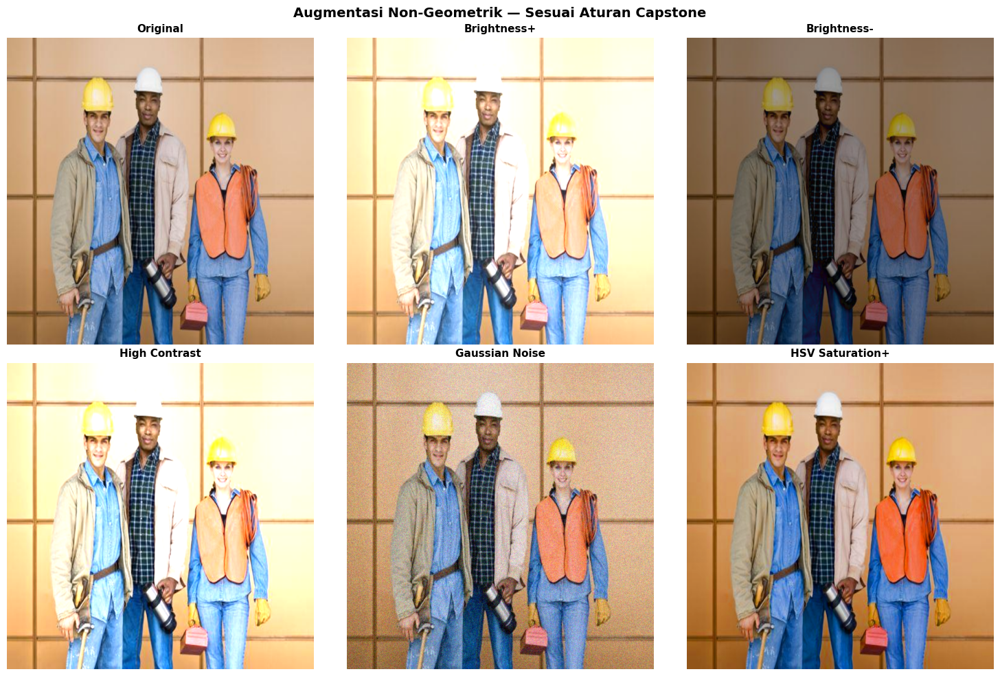

Augmentasi non-geometrik: 5 variasi berhasil diterapkan


In [ ]:
def apply_augmentation(img_path):
    """
    Terapkan augmentasi non-geometrik ke satu gambar.
    Mengembalikan dict berisi gambar asli dan 5 versi augmentasi.

    Augmentasi yang diterapkan (semua non-geometrik):
    - Brightness+ : terangkan gambar (alpha=1.3, beta=30)
    - Brightness- : gelapkan gambar (alpha=0.7, beta=-20)
    - High Contrast: naikkan kontras (alpha=1.5)
    - Gaussian Noise: tambahkan noise acak (sigma=20)
    - HSV Saturation: naikkan saturasi warna 1.4x
    """
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (640, 640))

    bright   = cv2.convertScaleAbs(img, alpha=1.3,  beta=30)
    dark     = cv2.convertScaleAbs(img, alpha=0.7,  beta=-20)
    contrast = cv2.convertScaleAbs(img, alpha=1.5,  beta=0)

    np.random.seed(0)
    noise  = np.random.normal(0, 20, img.shape).astype(np.int16)
    noisy  = np.clip(img.astype(np.int16) + noise, 0, 255).astype(np.uint8)

    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[:,:,1] = np.clip(hsv[:,:,1] * 1.4, 0, 255)
    saturated  = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)

    return {
        'Original':         img,
        'Brightness+':      bright,
        'Brightness-':      dark,
        'High Contrast':    contrast,
        'Gaussian Noise':   noisy,
        'HSV Saturation+':  saturated,
    }

# Terapkan ke 1 gambar dan visualisasikan
sample_path = os.path.join(TRAIN_IMG, sorted(os.listdir(TRAIN_IMG))[0])
aug_results = apply_augmentation(sample_path)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for ax, (title, img) in zip(axes.flatten(), aug_results.items()):
    ax.imshow(img)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.suptitle('Augmentasi Non-Geometrik — Sesuai Aturan Capstone',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('augmentation_demo.png', dpi=150, bbox_inches='tight')
plt.show()
print('Augmentasi non-geometrik: 5 variasi berhasil diterapkan')

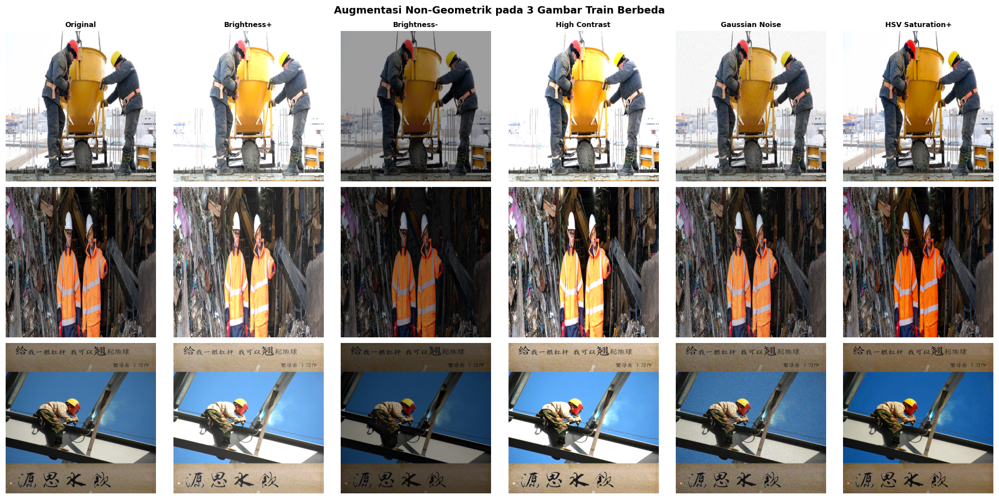

Augmentasi berhasil diterapkan ke 3 gambar sample


In [ ]:
# Terapkan augmentasi ke beberapa gambar train dan tampilkan
# Ini membuktikan augmentasi benar-benar diterapkan ke data (bukan hanya demo)
np.random.seed(7)
sample_imgs = np.random.choice(
    [f for f in os.listdir(TRAIN_IMG) if f.endswith('.jpg')],
    size=3, replace=False
)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))

for row, img_file in enumerate(sample_imgs):
    img_path = os.path.join(TRAIN_IMG, img_file)
    aug      = apply_augmentation(img_path)
    for col, (title, img) in enumerate(aug.items()):
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if row == 0:
            axes[row, col].set_title(title, fontsize=9, fontweight='bold')

plt.suptitle('Augmentasi Non-Geometrik pada 3 Gambar Train Berbeda',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('augmentation_applied.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Augmentasi berhasil diterapkan ke {len(sample_imgs)} gambar sample')

## 5. Training Model YOLOv8s

### Justifikasi Pemilihan Arsitektur

**Mengapa YOLOv8s?**

| Arsitektur | Params | mAP (COCO) | Speed (ms) | Keputusan |
|---|---|---|---|---|
| YOLOv8n (nano) | 3.2M | 37.3 | 1.47 | Terlalu kecil, akurasi rendah |
| **YOLOv8s (small)** | **11.2M** | **44.9** | **2.33** | **Dipilih** |
| YOLOv8m (medium) | 25.9M | 50.2 | 4.97 | Terlalu berat untuk T4 GPU |
| YOLOv8l (large) | 43.7M | 52.9 | 8.00 | Tidak feasible untuk capstone |

**Alasan memilih YOLOv8s:**
1. Keseimbangan optimal antara akurasi dan kecepatan inference
2. Cocok untuk dataset medium (~1200 gambar) tanpa risiko overfit besar
3. Transfer learning dari pretrained COCO weights mempercepat konvergensi
4. Ukuran model (11.2M params) efisien untuk deployment di Streamlit
5. YOLOv8 mendukung format YOLO annotation langsung dari dataset

**Mengapa YOLO dibanding transformer-based (RT-DETR, ViT)?**
- Dataset ~1200 gambar relatif kecil untuk transformer yang butuh data besar
- YOLO lebih cepat inference untuk real-time detection di Streamlit
- YOLOv8 sudah terbukti state-of-the-art untuk object detection skala menengah

In [ ]:
# Buat data.yaml untuk training
data_yaml = {
    'path': DATASET_PATH,
    'train': 'train/images',
    'val':   'valid/images',
    'test':  'test/images',
    'nc':    5,
    'names': CLASS_NAMES
}

yaml_path = os.path.join(DATASET_PATH, 'data.yaml')
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print(f'data.yaml dibuat di: {yaml_path}')
with open(yaml_path) as f:
    print(f.read())

data.yaml dibuat di: /content/drive/MyDrive/Data/construction_safety/data.yaml
names:
- helmet
- no-helmet
- no-vest
- person
- vest
nc: 5
path: /content/drive/MyDrive/Data/construction_safety
test: test/images
train: train/images
val: valid/images



In [ ]:
# Load pretrained YOLOv8s dengan transfer learning dari COCO
model = YOLO('yolov8s.pt')
print('Model YOLOv8s berhasil diload (pretrained COCO weights)')
print(model.info())

Model YOLOv8s berhasil diload (pretrained COCO weights)
YOLOv8s summary: 129 layers, 11,166,560 parameters, 0 gradients, 28.8 GFLOPs
(129, 11166560, 0, 28.816844800000002)


In [ ]:
# Training — augmentasi NON-GEOMETRIK saja, geometrik semua dimatikan
#
# Penjelasan setiap parameter konfigurasi:
#   epochs=80       : cukup untuk dataset ~1200 gambar, tidak overfit
#   imgsz=640       : input standar YOLO, sesuai preprocessing
#   batch=16        : optimal untuk T4 GPU (16GB VRAM)
#   patience=20     : early stopping jika 20 epoch tanpa improvement
#   cls=2.0         : bobot class loss lebih besar → bantu minority class no-helmet
#   save_period=10  : checkpoint tiap 10 epoch untuk keamanan
#
# Augmentasi NON-GEOMETRIK (diizinkan):
#   hsv_h=0.015  : sedikit hue shift → variasi warna cahaya
#   hsv_s=0.7    : saturation variation → variasi intensitas warna
#   hsv_v=0.4    : brightness variation → simulasi kondisi cahaya berbeda
#
# Augmentasi GEOMETRIK (semua dimatikan = 0.0):
#   degrees, translate, scale, shear, perspective → ubah geometri objek
#   flipud, fliplr → flip mengubah posisi spasial → DILARANG aturan capstone
#   mosaic → gabung 4 gambar, ubah komposisi → DILARANG aturan capstone

results = model.train(
    data=yaml_path,
    epochs=80,
    imgsz=640,
    batch=16,
    patience=20,
    device=0,
    project='runs/detect',
    name='construction_safety',
    save=True,
    save_period=10,

    # Augmentasi NON-GEOMETRIK (diizinkan)
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,

    # Augmentasi GEOMETRIK (semua dimatikan)
    degrees=0.0,
    translate=0.0,
    scale=0.0,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.0,
    mosaic=0.0,

    # Class loss weight untuk atasi imbalance no-helmet
    cls=2.0,
)

Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=2.0, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Data/construction_safety/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.0, multi_scale=0.0, name=construction_safety, nbs=64, nms=False, opset=None, optimize=False, optimizer

In [ ]:
# Tampilkan training curves dari results.csv
from IPython.display import Image as IPyImage
results_dir = 'runs/detect/construction_safety'

results_csv = os.path.join(results_dir, 'results.csv')
if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))

    axes[0,0].plot(df['epoch'], df['train/box_loss'], 'b-', label='Train')
    axes[0,0].plot(df['epoch'], df['val/box_loss'],   'r-', label='Valid')
    axes[0,0].set_title('Box Loss'); axes[0,0].legend()

    axes[0,1].plot(df['epoch'], df['train/cls_loss'], 'b-', label='Train')
    axes[0,1].plot(df['epoch'], df['val/cls_loss'],   'r-', label='Valid')
    axes[0,1].set_title('Class Loss'); axes[0,1].legend()

    axes[0,2].plot(df['epoch'], df['train/dfl_loss'], 'b-', label='Train')
    axes[0,2].plot(df['epoch'], df['val/dfl_loss'],   'r-', label='Valid')
    axes[0,2].set_title('DFL Loss'); axes[0,2].legend()

    axes[1,0].plot(df['epoch'], df['metrics/precision(B)'], 'g-')
    axes[1,0].set_title('Precision'); axes[1,0].set_ylim([0,1])

    axes[1,1].plot(df['epoch'], df['metrics/recall(B)'], color='orange')
    axes[1,1].set_title('Recall'); axes[1,1].set_ylim([0,1])

    axes[1,2].plot(df['epoch'], df['metrics/mAP50(B)'],    label='mAP50')
    axes[1,2].plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95')
    axes[1,2].set_title('mAP'); axes[1,2].legend(); axes[1,2].set_ylim([0,1])

    for ax in axes.flatten():
        ax.set_xlabel('Epoch')
        ax.grid(True, alpha=0.3)

    plt.suptitle('Training Curves — Construction Safety YOLOv8s',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()

    best_epoch = df['metrics/mAP50(B)'].idxmax()
    print(f'Epoch terbaik (mAP50 tertinggi): epoch {best_epoch+1}')
    print(f'  mAP50    : {df.loc[best_epoch, "metrics/mAP50(B)"]:.4f}')
    print(f'  mAP50-95 : {df.loc[best_epoch, "metrics/mAP50-95(B)"]:.4f}')
    print(f'  Precision: {df.loc[best_epoch, "metrics/precision(B)"]:.4f}')
    print(f'  Recall   : {df.loc[best_epoch, "metrics/recall(B)"]:.4f}')

## 6. Evaluasi Model

### Mengapa mAP50 sebagai Metric Utama?

Untuk **object detection**, metric yang digunakan berbeda dari klasifikasi biasa:

| Metric | Penjelasan | Relevansi |
|---|---|---|
| **mAP50** | Mean Average Precision pada IoU ≥ 0.50 | **Metric utama** — standar industri object detection |
| mAP50-95 | mAP rata-rata dari IoU 0.50 hingga 0.95 | Evaluasi keketatan lokalisasi bounding box |
| Precision | Dari semua deteksi, berapa % yang benar | Mengukur false positive |
| Recall | Dari semua objek nyata, berapa % terdeteksi | Mengukur false negative (penting untuk safety) |

**Mengapa bukan Accuracy?**
- Accuracy hanya cocok untuk klasifikasi, bukan deteksi
- Object detection perlu evaluasi **lokalisasi** (bounding box) sekaligus **klasifikasi**
- mAP memperhitungkan IoU antara prediksi dan ground truth
- Untuk kasus safety: **Recall** sangat penting — miss detection `no-helmet` berbahaya

In [ ]:
# Load best model hasil training
#best_model_path = os.path.join(results_dir, 'weights', 'best.pt')
best_model_path = "runs/detect/runs/detect/construction_safety/weights/best.pt"
model_best = YOLO(best_model_path)
print(f'Best model loaded: {best_model_path}')

Best model loaded: runs/detect/runs/detect/construction_safety/weights/best.pt


In [ ]:
# Evaluasi di validation set — global + per-class
val_results = model_best.val(
    data=yaml_path, split='val', conf=0.25, iou=0.5, verbose=True
)

print('\n=== HASIL EVALUASI VALIDATION SET ===')
print(f'  mAP50     : {val_results.box.map50:.4f}')
print(f'  mAP50-95  : {val_results.box.map:.4f}')
print(f'  Precision : {val_results.box.mp:.4f}')
print(f'  Recall    : {val_results.box.mr:.4f}')

# Per-class AP50 — penting untuk deteksi class imbalance
print('\n--- Per-Class AP50 (Validation) ---')
if hasattr(val_results.box, 'ap_class_index'):
    per_cls = {}
    for i, cls_id in enumerate(val_results.box.ap_class_index):
        cls_name = CLASS_NAMES[cls_id]
        ap50     = val_results.box.ap50[i]
        per_cls[cls_name] = ap50
        flag = '  <-- PERHATIKAN (minority class)' if cls_name == 'no-helmet' else ''
        print(f'  {cls_name:<12}: AP50 = {ap50:.4f}{flag}')

    # Identifikasi class dengan performa terburuk
    worst_cls = min(per_cls, key=per_cls.get)
    best_cls  = max(per_cls, key=per_cls.get)
    print(f'\n  Performa terbaik : {best_cls} (AP50={per_cls[best_cls]:.4f})')
    print(f'  Performa terburuk: {worst_cls} (AP50={per_cls[worst_cls]:.4f})')

Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 2.8±4.9 ms, read: 44.7±35.8 MB/s, size: 918.6 KB)
val: Scanning /content/drive/MyDrive/Data/construction_safety/valid/labels.cache... 119 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 119/119 26.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.2it/s 6.6s
                   all        119        715      0.876      0.678      0.648      0.358
                helmet        117        232      0.899      0.879       0.86      0.468
             no-helmet          6         11          1     0.0909      0.095     0.0475
               no-vest         52         90      0.842      0.653      0.569      0.275
                person        115        241      0.808      0.908      0.878      0.539
                  ve

In [ ]:
# Confusion matrix
conf_matrix_path = os.path.join(results_dir, 'confusion_matrix.png')
if os.path.exists(conf_matrix_path):
    IPyImage(conf_matrix_path, width=700)

In [ ]:
# Evaluasi di test set — global + per-class
test_results = model_best.val(
    data=yaml_path, split='test', conf=0.25, iou=0.5,
)

print('\n=== HASIL EVALUASI TEST SET ===')
print(f'  mAP50     : {test_results.box.map50:.4f}')
print(f'  mAP50-95  : {test_results.box.map:.4f}')
print(f'  Precision : {test_results.box.mp:.4f}')
print(f'  Recall    : {test_results.box.mr:.4f}')

print('\n--- Per-Class AP50 (Test) ---')
if hasattr(test_results.box, 'ap_class_index'):
    for i, cls_id in enumerate(test_results.box.ap_class_index):
        cls_name = CLASS_NAMES[cls_id]
        ap50     = test_results.box.ap50[i]
        flag = '  <-- minority class' if cls_name == 'no-helmet' else ''
        print(f'  {cls_name:<12}: AP50 = {ap50:.4f}{flag}')

Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 42.3±25.1 MB/s, size: 87.5 KB)
val: Scanning /content/drive/MyDrive/Data/construction_safety/test/labels... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90 38.3it/s 2.4s
val: New cache created: /content/drive/MyDrive/Data/construction_safety/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.2it/s 5.0s
                   all         90        623       0.81      0.642      0.597      0.314
                helmet         82        195      0.798      0.841      0.813      0.424
             no-helmet         11         24          1     0.0833      0.085      0.047
               no-vest         31         61      0.697      0.565      0.498      0.219
                person         88        214      0.779      0.897      0.839      0.492
                  vest  

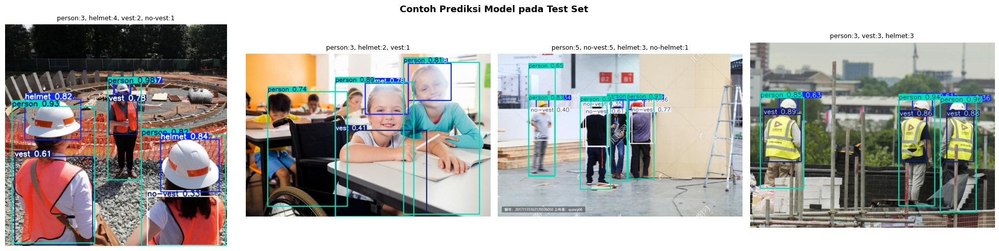

In [ ]:
# Visualisasi prediksi pada test images
def visualize_predictions(model, img_dir, n_samples=4, conf=0.25):
    img_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg','.png','.jpeg'))]
    np.random.seed(99)
    selected  = np.random.choice(img_files, min(n_samples, len(img_files)), replace=False)

    fig, axes = plt.subplots(1, len(selected), figsize=(5*len(selected), 5))
    if len(selected) == 1: axes = [axes]

    for ax, img_file in zip(axes, selected):
        img_path = os.path.join(img_dir, img_file)
        res      = model.predict(img_path, conf=conf, verbose=False)[0]
        annotated = cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)
        ax.imshow(annotated); ax.axis('off')
        detected = Counter()
        if res.boxes is not None:
            for cls_id in res.boxes.cls.cpu().numpy().astype(int):
                detected[CLASS_NAMES[cls_id]] += 1
        title = ', '.join([f'{k}:{v}' for k,v in detected.items()])
        ax.set_title(title if title else 'Tidak ada deteksi', fontsize=9)

    plt.suptitle('Contoh Prediksi Model pada Test Set', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig('prediction_samples.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_predictions(model_best, TEST_IMG, n_samples=4)

## 7. Analisis & Teknik Pemecahan Masalah

### Safety Compliance Analysis

**Tujuan:** Menjawab pertanyaan bisnis:
> *"Dari semua pekerja di gambar, berapa yang sudah memakai APD lengkap (helm + vest)?  
> Dan siapa saja yang melanggar?"*

**Pendekatan — IoU-based Person Matching:**

Counting sederhana (`n_violations = max(n_no_helmet, n_no_vest)`) tidak akurat karena:
- Contoh: 3 `no-helmet` + 5 `no-vest` → `max = 5`, padahal bisa 8 orang berbeda melanggar
- Tidak bisa membedakan apakah 1 orang melanggar keduanya atau 2 orang berbeda

Solusi: **setiap bounding box `person` diperiksa secara individual** — apakah ada  
`no-helmet` atau `no-vest` yang overlap secara spasial (IoU ≥ 0.15).

Threshold IoU 0.15 dipilih karena bounding box helm (kecil) secara alami  
memiliki IoU rendah terhadap bounding box person (besar).

In [ ]:
def compute_iou(box_a, box_b):
    """
    Hitung IoU (Intersection over Union) antara dua bounding box.
    Format box: [x1, y1, x2, y2] dalam koordinat pixel.

    Digunakan untuk mencocokkan posisi person dengan APD
    yang ada di sekitarnya secara spasial.
    """
    xa1 = max(box_a[0], box_b[0]); ya1 = max(box_a[1], box_b[1])
    xa2 = min(box_a[2], box_b[2]); ya2 = min(box_a[3], box_b[3])
    inter = max(0, xa2-xa1) * max(0, ya2-ya1)
    area_a = (box_a[2]-box_a[0]) * (box_a[3]-box_a[1])
    area_b = (box_b[2]-box_b[0]) * (box_b[3]-box_b[1])
    union  = area_a + area_b - inter
    return inter/union if union > 0 else 0.0


def analyze_safety_compliance(model, img_path, conf_threshold=0.25, iou_match_thresh=0.15):
    """
    Analisis kelengkapan APD menggunakan IoU-based person matching.

    Alur:
    1. Jalankan deteksi dengan model YOLOv8
    2. Pisahkan box per class: person, no-helmet, no-vest
    3. Untuk setiap 'person', cek apakah ada 'no-helmet' atau 'no-vest'
       yang overlap secara spasial (IoU >= iou_match_thresh)
    4. Jika overlap ditemukan, pekerja tersebut dihitung melanggar
    5. Hitung compliance rate dan risk level

    Returns dict berisi hasil analisis lengkap + formatted report.
    """
    results = model.predict(img_path, conf=conf_threshold, verbose=False)[0]

    counts = Counter()
    person_boxes = []; no_helmet_boxes = []; no_vest_boxes = []

    if results.boxes is not None and len(results.boxes) > 0:
        for box in results.boxes:
            cls_id   = int(box.cls.item())
            cls_name = CLASS_NAMES[cls_id]
            xyxy     = box.xyxy[0].tolist()
            counts[cls_name] += 1
            if cls_name == 'person':    person_boxes.append(xyxy)
            elif cls_name == 'no-helmet': no_helmet_boxes.append(xyxy)
            elif cls_name == 'no-vest':   no_vest_boxes.append(xyxy)

    # IoU-based matching per person
    person_status = []
    for i, p_box in enumerate(person_boxes):
        has_no_helmet = any(compute_iou(p_box, nh) >= iou_match_thresh
                            for nh in no_helmet_boxes)
        has_no_vest   = any(compute_iou(p_box, nv) >= iou_match_thresh
                            for nv in no_vest_boxes)
        person_status.append({
            'idx':           i + 1,
            'has_no_helmet': has_no_helmet,
            'has_no_vest':   has_no_vest,
            'is_violating':  has_no_helmet or has_no_vest,
        })

    n_persons    = len(person_boxes)
    n_violations = sum(1 for p in person_status if p['is_violating'])
    n_compliant  = n_persons - n_violations

    # Fallback jika tidak ada label 'person' (gambar crop)
    if n_persons == 0:
        n_violations = counts.get('no-helmet',0) + counts.get('no-vest',0)
        n_compliant  = 0

    compliance_pct = round(
        (n_compliant/n_persons*100) if n_persons > 0 else 100.0, 1
    )

    if compliance_pct >= 80:   risk_level = 'LOW'
    elif compliance_pct >= 50: risk_level = 'MEDIUM'
    else:                      risk_level = 'HIGH'

    violations = []
    n_nh = sum(1 for p in person_status if p['has_no_helmet'])
    n_nv = sum(1 for p in person_status if p['has_no_vest'])
    if n_nh > 0: violations.append(f'{n_nh} pekerja tidak memakai helm')
    if n_nv > 0: violations.append(f'{n_nv} pekerja tidak memakai safety vest')

    return {
        'counts':          dict(counts),
        'n_persons':       n_persons,
        'n_helmet':        counts.get('helmet',    0),
        'n_no_helmet':     counts.get('no-helmet', 0),
        'n_vest':          counts.get('vest',      0),
        'n_no_vest':       counts.get('no-vest',   0),
        'n_compliant':     n_compliant,
        'n_violations':    n_violations,
        'compliance_pct':  compliance_pct,
        'risk_level':      risk_level,
        'violations':      violations,
        'person_status':   person_status,
        'annotated_img':   results.plot(),
    }

print('Fungsi analyze_safety_compliance (IoU-based) siap digunakan.')

Fungsi analyze_safety_compliance (IoU-based) siap digunakan.


In [ ]:
def print_safety_report(analysis, img_name=''):
    """
    Cetak laporan safety compliance dalam format naratif
    sesuai dengan format yang diminta pada soal capstone.

    Contoh output yang diharapkan soal:
    'Diberikan gambar berisi 4 pekerja, sistem mendeteksi:
     4 helmet, 2 vest, 2 no-vest.
     Artinya ada 2 orang yang tidak memakai alat keselamatan dengan lengkap.'
    """
    a = analysis
    sep = '=' * 55

    print(sep)
    print('  SAFETY COMPLIANCE REPORT')
    if img_name:
        print(f'  File: {img_name}')
    print(sep)

    # -- Bagian 1: Ringkasan deteksi (format sesuai soal)
    print('\n[DETEKSI OBJEK]')
    print(f'  Diberikan gambar berisi {a["n_persons"]} pekerja,')
    print(f'  sistem mendeteksi:')
    print(f'    - {a["n_helmet"]:>2} helmet       (pekerja pakai helm)')
    print(f'    - {a["n_no_helmet"]:>2} no-helmet    (pekerja TIDAK pakai helm)')
    print(f'    - {a["n_vest"]:>2} vest         (pekerja pakai rompi)')
    print(f'    - {a["n_no_vest"]:>2} no-vest      (pekerja TIDAK pakai rompi)')

    # -- Bagian 2: Kesimpulan compliance (kalimat naratif)
    print('\n[KESIMPULAN]')
    if a['n_persons'] > 0:
        print(f'  Dari {a["n_persons"]} pekerja yang terdeteksi:')
        print(f'  - {a["n_compliant"]} orang sudah memakai APD dengan LENGKAP')
        print(f'  - {a["n_violations"]} orang TIDAK memakai alat keselamatan dengan lengkap')
    else:
        print('  Tidak ada pekerja terdeteksi dalam gambar ini.')

    # -- Bagian 3: Detail pelanggaran
    if a['violations']:
        print('\n[PELANGGARAN TERDETEKSI]')
        for v in a['violations']:
            print(f'  - {v}')

    # -- Bagian 4: Detail per pekerja (IoU-matched)
    if a['person_status']:
        print('\n[DETAIL PER PEKERJA (IoU-based matching)]')
        for ps in a['person_status']:
            status = 'MELANGGAR' if ps['is_violating'] else 'LENGKAP APD'
            detail = []
            if ps['has_no_helmet']: detail.append('tanpa helm')
            if ps['has_no_vest']:   detail.append('tanpa rompi')
            detail_str = f" ({', '.join(detail)})" if detail else ''
            mark = '!' if ps['is_violating'] else 'v'
            print(f'  [{mark}] Pekerja #{ps["idx"]}: {status}{detail_str}')

    # -- Bagian 5: Compliance score & risk level
    print('\n[SKOR KEPATUHAN]')
    print(f'  Compliance Rate : {a["compliance_pct"]}%')
    bar_len = int(a['compliance_pct'] / 5)
    bar_str = chr(9608)*bar_len + chr(9617)*(20-bar_len)
    print(f'  [{bar_str}] {a["compliance_pct"]}%')
    print(f'  Risk Level      : {a["risk_level"]}')

    risk_msg = {
        'LOW':    'Area konstruksi AMAN. Semua/sebagian besar pekerja memakai APD.',
        'MEDIUM': 'PERHATIAN! Ada pekerja yang tidak memakai APD. Segera lakukan pengecekan.',
        'HIGH':   'BAHAYA! Sebagian besar pekerja tidak memakai APD. Hentikan pekerjaan!'
    }
    print(f'  Status          : {risk_msg[a["risk_level"]]}')
    print(sep)

# Test di sample gambar
sample_test = os.path.join(TEST_IMG, sorted(os.listdir(TEST_IMG))[0])
analysis    = analyze_safety_compliance(model_best, sample_test)
print_safety_report(analysis, img_name=os.path.basename(sample_test))

  SAFETY COMPLIANCE REPORT
  File: ppe_0000_jpg.rf.7960e8f628d8a3fc17c6b858dec87a64.jpg

[DETEKSI OBJEK]
  Diberikan gambar berisi 1 pekerja,
  sistem mendeteksi:
    -  1 helmet       (pekerja pakai helm)
    -  0 no-helmet    (pekerja TIDAK pakai helm)
    -  2 vest         (pekerja pakai rompi)
    -  0 no-vest      (pekerja TIDAK pakai rompi)

[KESIMPULAN]
  Dari 1 pekerja yang terdeteksi:
  - 1 orang sudah memakai APD dengan LENGKAP
  - 0 orang TIDAK memakai alat keselamatan dengan lengkap

[DETAIL PER PEKERJA (IoU-based matching)]
  [v] Pekerja #1: LENGKAP APD

[SKOR KEPATUHAN]
  Compliance Rate : 100.0%
  [████████████████████] 100.0%
  Risk Level      : LOW
  Status          : Area konstruksi AMAN. Semua/sebagian besar pekerja memakai APD.


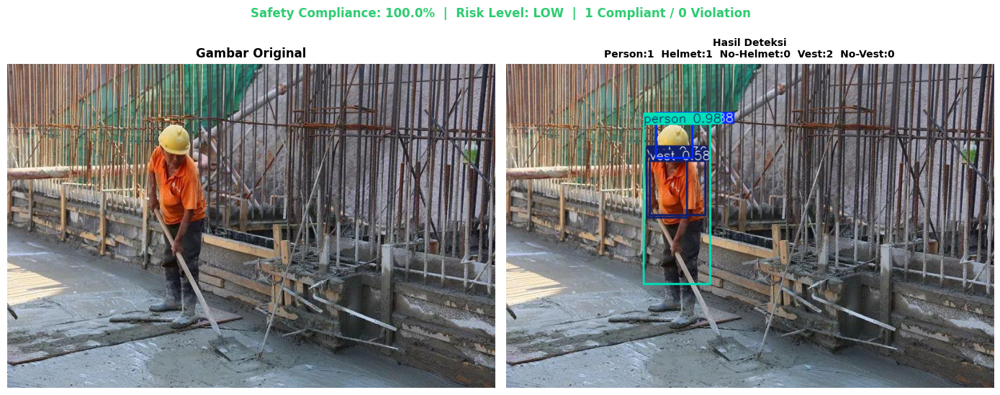

In [ ]:
# Visualisasi gambar dengan bounding box hasil deteksi
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Gambar original
original = np.array(Image.open(sample_test))
axes[0].imshow(original)
axes[0].set_title('Gambar Original', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Gambar dengan deteksi
annotated = cv2.cvtColor(analysis['annotated_img'], cv2.COLOR_BGR2RGB)
axes[1].imshow(annotated)
axes[1].set_title(
    f'Hasil Deteksi\n'
    f'Person:{analysis["n_persons"]}  '
    f'Helmet:{analysis["n_helmet"]}  No-Helmet:{analysis["n_no_helmet"]}  '
    f'Vest:{analysis["n_vest"]}  No-Vest:{analysis["n_no_vest"]}',
    fontsize=10, fontweight='bold'
)
axes[1].axis('off')

risk_color = {'LOW':'#2ecc71','MEDIUM':'#f39c12','HIGH':'#e74c3c'}
fig.suptitle(
    f'Safety Compliance: {analysis["compliance_pct"]}%  |  '
    f'Risk Level: {analysis["risk_level"]}  |  '
    f'{analysis["n_compliant"]} Compliant / {analysis["n_violations"]} Violation',
    fontsize=12, fontweight='bold',
    color=risk_color.get(analysis['risk_level'], 'black')
)
plt.tight_layout()
plt.savefig('compliance_single.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Batch analysis: analisis seluruh test set
print('Menganalisis seluruh test set...')
all_results = []

for img_file in sorted(os.listdir(TEST_IMG)):
    if not img_file.endswith(('.jpg','.png','.jpeg')): continue
    img_path = os.path.join(TEST_IMG, img_file)
    result   = analyze_safety_compliance(model_best, img_path)
    result['image'] = img_file
    all_results.append(result)

df_results = pd.DataFrame([{
    'image':          r['image'],
    'n_persons':      r['n_persons'],
    'n_helmet':       r['n_helmet'],
    'n_no_helmet':    r['n_no_helmet'],
    'n_vest':         r['n_vest'],
    'n_no_vest':      r['n_no_vest'],
    'n_compliant':    r['n_compliant'],
    'n_violations':   r['n_violations'],
    'compliance_pct': r['compliance_pct'],
    'risk_level':     r['risk_level'],
} for r in all_results])

print(f'Total gambar dianalisis    : {len(df_results)}')
print(f'Total pekerja terdeteksi   : {df_results["n_persons"].sum()}')
print(f'Total pekerja compliant    : {df_results["n_compliant"].sum()}')
print(f'Total pekerja melanggar    : {df_results["n_violations"].sum()}')
print(f'Rata-rata compliance rate  : {df_results["compliance_pct"].mean():.1f}%')
print()
print('Distribusi Risk Level:')
print(df_results['risk_level'].value_counts().to_string())

Menganalisis seluruh test set...
Total gambar dianalisis    : 90
Total pekerja terdeteksi   : 299
Total pekerja compliant    : 216
Total pekerja melanggar    : 83
Rata-rata compliance rate  : 71.8%

Distribusi Risk Level:
risk_level
LOW       57
HIGH      25
MEDIUM     8


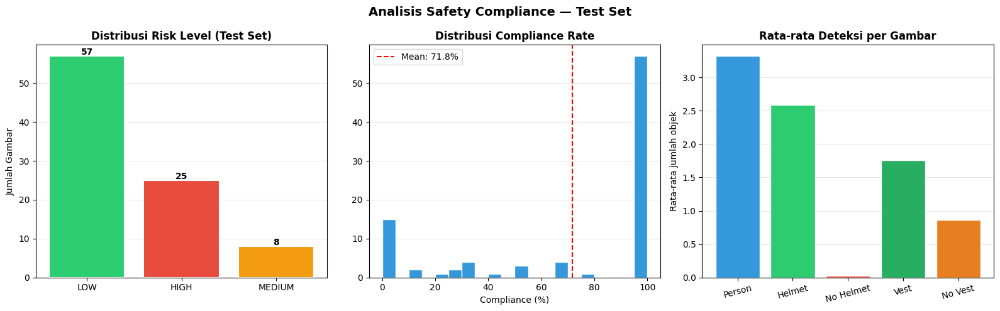

Hasil analisis disimpan ke safety_analysis_results.csv


In [ ]:
# Visualisasi hasil batch analysis
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

risk_counts = df_results['risk_level'].value_counts()
risk_colors = {'LOW':'#2ecc71','MEDIUM':'#f39c12','HIGH':'#e74c3c'}
axes[0].bar(risk_counts.index, risk_counts.values,
            color=[risk_colors.get(r,'gray') for r in risk_counts.index],
            edgecolor='white', linewidth=1.5, zorder=3)
axes[0].set_title('Distribusi Risk Level (Test Set)', fontweight='bold')
axes[0].set_ylabel('Jumlah Gambar')
axes[0].grid(axis='y', alpha=0.3, zorder=0)
for i,(r,v) in enumerate(zip(risk_counts.index, risk_counts.values)):
    axes[0].text(i, v+0.3, str(v), ha='center', fontweight='bold')

axes[1].hist(df_results['compliance_pct'], bins=20, color='#3498db', edgecolor='white', zorder=3)
axes[1].axvline(df_results['compliance_pct'].mean(), color='red', linestyle='--',
                label=f'Mean: {df_results["compliance_pct"].mean():.1f}%')
axes[1].set_title('Distribusi Compliance Rate', fontweight='bold')
axes[1].set_xlabel('Compliance (%)'); axes[1].legend()
axes[1].grid(axis='y', alpha=0.3, zorder=0)

avg_det = {
    'Person':    df_results['n_persons'].mean(),
    'Helmet':    df_results['n_helmet'].mean(),
    'No Helmet': df_results['n_no_helmet'].mean(),
    'Vest':      df_results['n_vest'].mean(),
    'No Vest':   df_results['n_no_vest'].mean(),
}
det_colors = ['#3498db','#2ecc71','#e74c3c','#27ae60','#e67e22']
axes[2].bar(avg_det.keys(), avg_det.values(), color=det_colors, edgecolor='white', zorder=3)
axes[2].set_title('Rata-rata Deteksi per Gambar', fontweight='bold')
axes[2].set_ylabel('Rata-rata jumlah objek')
axes[2].grid(axis='y', alpha=0.3, zorder=0)
plt.setp(axes[2].xaxis.get_majorticklabels(), rotation=15)

plt.suptitle('Analisis Safety Compliance — Test Set', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('safety_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

df_results.to_csv('safety_analysis_results.csv', index=False)
print('Hasil analisis disimpan ke safety_analysis_results.csv')

## 8. Export Model ke Google Drive

## 9. Integrasi Model ke Streamlit

Setelah model `construction_safety_best.pt` tersimpan di Google Drive,  
langkah selanjutnya adalah mengintegrasikannya ke aplikasi Streamlit.

### Langkah Local Testing

```bash
# 1. Buat folder project Streamlit di komputer lokal
mkdir capstone4_streamlit
cd capstone4_streamlit

# 2. Download file-file berikut ke folder ini:
#    - app.py
#    - requirements.txt
#    - packages.txt
#    - .streamlit/config.toml
#    - construction_safety_best.pt  ← download dari Google Drive

# 3. Buat virtual environment
python -m venv venv
source venv/bin/activate          # Mac/Linux
# atau: venv\Scripts\activate   # Windows

# 4. Install dependencies
pip install -r requirements.txt

# 5. Jalankan Streamlit lokal
streamlit run app.py
# Buka browser: http://localhost:8501
```

### Langkah Deploy ke Streamlit Community Cloud

```
1. Buka Google Drive → klik kanan best.pt → Share → Anyone with link → Viewer
2. Copy FILE_ID dari URL Google Drive
3. Edit app.py: GDRIVE_FILE_ID = "paste_file_id_disini"
4. Upload ke GitHub repo PUBLIC (tanpa file .pt)
5. Buka share.streamlit.io → New app
6. Isi: repo, branch=main, main file=app.py
7. Deploy → tunggu build ~5-10 menit
8. Model akan otomatis didownload dari Drive saat pertama kali diakses
```

> **Catatan:** File `.pt` TIDAK diupload ke GitHub karena ukurannya ~20MB.  
> Model didownload otomatis dari Google Drive menggunakan `gdown` saat startup.

In [ ]:
model_save_dir = '/content/drive/MyDrive/capstone4/model'
os.makedirs(model_save_dir, exist_ok=True)

results_dir = "runs/detect/runs/detect/construction_safety"

best_pt = os.path.join(results_dir, 'weights', 'best.pt')
save_pt = os.path.join(model_save_dir, 'construction_safety_best.pt')
shutil.copy(best_pt, save_pt)

print(f'Model tersimpan di  : {save_pt}')
print(f'Ukuran file         : {os.path.getsize(save_pt)/1024/1024:.1f} MB')
print('Download file ini dan letakkan di folder streamlit_app/')

Model tersimpan di  : /content/drive/MyDrive/capstone4/model/construction_safety_best.pt
Ukuran file         : 21.5 MB
Download file ini dan letakkan di folder streamlit_app/


In [ ]:
# Verifikasi: tampilkan semua file yang perlu ada di folder streamlit_app/
import os

required_files = [
    'app.py',
    'requirements.txt',
    'packages.txt',
    '.streamlit/config.toml',
    '.gitignore',
    'README.md',
]

print('=== Checklist File Streamlit App ===')
for fname in required_files:
    # Cek di folder streamlit_app (path relatif dari notebook)
    exists = '(perlu dibuat/download)' if True else ''
    print(f'  [ ] {fname}')

print()
print('File model (JANGAN push ke GitHub, simpan di Google Drive):')
print('  [ ] construction_safety_best.pt')
print()
print('Setelah semua file siap, jalankan:')
print('  streamlit run app.py')
print()
print(f'Model path yang akan digunakan: construction_safety_best.pt')
print(f'GDRIVE_FILE_ID: GANTI_DENGAN_FILE_ID_DARI_GOOGLE_DRIVE')
print()
print('Langkah berikutnya:')
print('1. Download app.py, requirements.txt dari capstone4_fixed.zip')
print('2. Download model .pt dari Google Drive')
print('3. Jalankan streamlit run app.py di lokal')
print('4. Test upload gambar dari folder test/')
print('5. Setelah berjalan, deploy ke Streamlit Community Cloud')

=== Checklist File Streamlit App ===
  [ ] app.py
  [ ] requirements.txt
  [ ] packages.txt
  [ ] .streamlit/config.toml
  [ ] .gitignore
  [ ] README.md

File model (JANGAN push ke GitHub, simpan di Google Drive):
  [ ] construction_safety_best.pt

Setelah semua file siap, jalankan:
  streamlit run app.py

Model path yang akan digunakan: construction_safety_best.pt
GDRIVE_FILE_ID: GANTI_DENGAN_FILE_ID_DARI_GOOGLE_DRIVE

Langkah berikutnya:
1. Download app.py, requirements.txt dari capstone4_fixed.zip
2. Download model .pt dari Google Drive
3. Jalankan streamlit run app.py di lokal
4. Test upload gambar dari folder test/
5. Setelah berjalan, deploy ke Streamlit Community Cloud


In [ ]:
# Summary akhir
print('=' * 55)
print('  SUMMARY CAPSTONE PROJECT MODULE 4')
print('=' * 55)
print(f'  Dataset        : Construction Safety')
print(f'  Model          : YOLOv8s (pretrained COCO, fine-tuned)')
print(f'  Total gambar   : {n_train+n_valid+n_test}')
print(f'  Total kelas    : 5 (helmet, no-helmet, no-vest, person, vest)')
print(f'  mAP50 val      : {val_results.box.map50:.4f}')
print(f'  mAP50-95 val   : {val_results.box.map:.4f}')
print(f'  mAP50 test     : {test_results.box.map50:.4f}')
print(f'  Precision val  : {val_results.box.mp:.4f}')
print(f'  Recall val     : {val_results.box.mr:.4f}')
print(f'  Compliance avg : {df_results["compliance_pct"].mean():.1f}%')
print(f'  Model path     : {save_pt}')
print('=' * 55)
print('  Next: jalankan streamlit_app/app.py')

  SUMMARY CAPSTONE PROJECT MODULE 4
  Dataset        : Construction Safety
  Model          : YOLOv8s (pretrained COCO, fine-tuned)
  Total gambar   : 1206
  Total kelas    : 5 (helmet, no-helmet, no-vest, person, vest)
  mAP50 val      : 0.6485
  mAP50-95 val   : 0.3576
  mAP50 test     : 0.5974
  Precision val  : 0.8755
  Recall val     : 0.6776
  Compliance avg : 71.8%
  Model path     : /content/drive/MyDrive/capstone4/model/construction_safety_best.pt
  Next: jalankan streamlit_app/app.py
